In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
import pathlib
data_dir = pathlib.Path(r"C:\Users\Admin\Desktop\dataset\Emotions")
data_dir

WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions')

In [3]:
list(data_dir.glob('*/*.jpg'))[:10]

[WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (1).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (10).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (11).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (12).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (13).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (14).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (15).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (16).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (17).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/happy/1 (18).jpg')]

In [4]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

1686


In [5]:
len_very_happy = len(list(data_dir.glob('happy/*')))
len_very_happy

51

In [6]:
very_happy = list(data_dir.glob('very_happy/*'))
very_happy[:5]

[WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (1).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (10).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (11).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (12).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (13).jpg')]

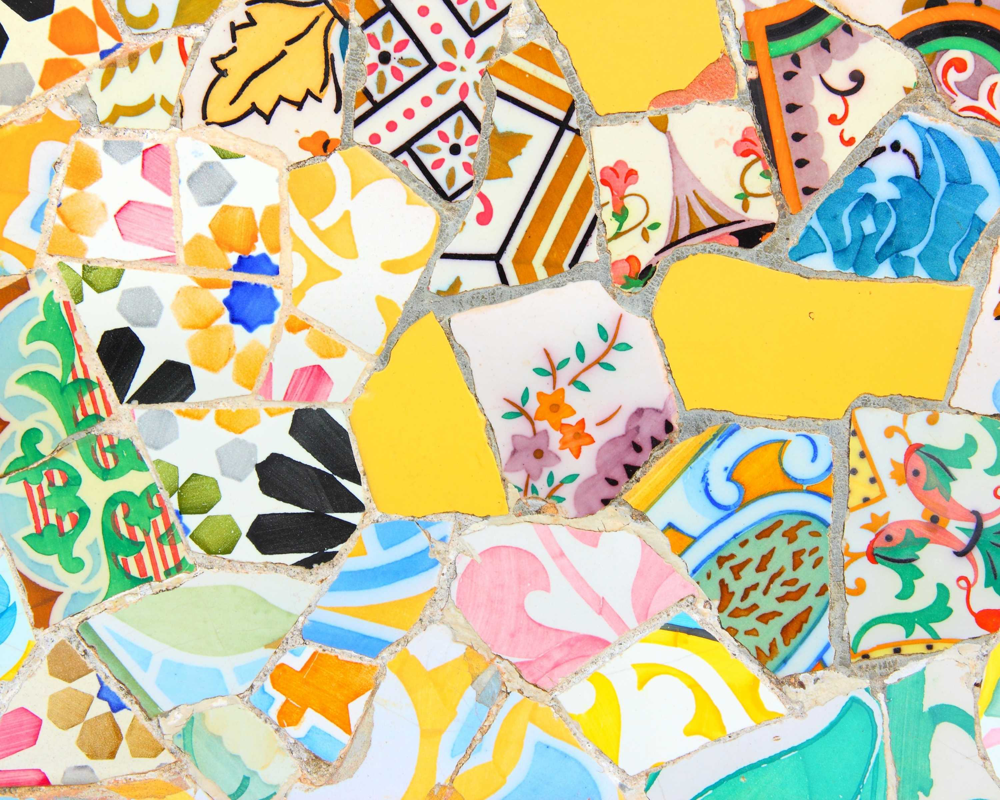

In [8]:
PIL.Image.open(str(very_happy[10]))

In [9]:
emotions_images_dict = {
    'very_happy': list(data_dir.glob('very_happy/*')),
    'happy': list(data_dir.glob('happy/*')),
    'neutral': list(data_dir.glob('neutral/*')),
    'sad': list(data_dir.glob('sad/*')),
    'very_sad': list(data_dir.glob('very_sad/*')),
}

In [10]:
emotions_labels_dict = {
    'very_happy': 0,
    'happy': 1,
    'neutral': 2,
    'sad': 3,
    'very_sad': 4,
}

In [11]:
emotions_images_dict['very_happy'][:5]

[WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (1).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (10).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (11).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (12).jpg'),
 WindowsPath('C:/Users/Admin/Desktop/dataset/Emotions/very_happy/4 (13).jpg')]

In [12]:
str(emotions_images_dict['very_happy'][0])

'C:\\Users\\Admin\\Desktop\\dataset\\Emotions\\very_happy\\4 (1).jpg'

In [13]:
img = cv2.imread(str(emotions_images_dict['very_happy'][10]))

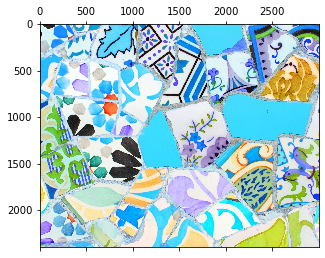

In [14]:
plt.matshow(img)

In [15]:
img.shape

(2400, 3000, 3)

In [16]:
cv2.resize(img,(180,180)).shape

(180, 180, 3)

In [17]:
X, y = [], []

for emotion, images in emotions_images_dict.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img,(180,180))
        X.append(resized_img)
        y.append(emotions_labels_dict[emotion])




In [18]:
X = np.array(X)
y = np.array(y)

In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

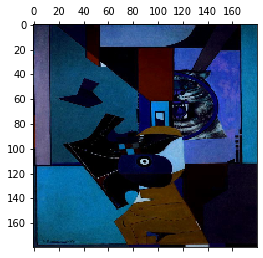

In [31]:
plt.matshow(X_test[1500])

In [32]:
y_test[1500]

3

In [33]:
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [34]:
num_classes = 5

model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
model.fit(X_train_scaled, y_train, epochs=5)  

Epoch 1/5
168/168 [==============================] - 31s 179ms/step - loss: 1.3918 - accuracy: 0.4135
Epoch 2/5
168/168 [==============================] - 30s 178ms/step - loss: 1.1189 - accuracy: 0.5428
Epoch 3/5
168/168 [==============================] - 39s 231ms/step - loss: 1.0082 - accuracy: 0.5968
Epoch 4/5
168/168 [==============================] - 51s 301ms/step - loss: 0.8957 - accuracy: 0.6448
Epoch 5/5
168/168 [==============================] - 51s 304ms/step - loss: 0.7487 - accuracy: 0.7136


In [35]:
model.evaluate(X_test_scaled,y_test)

56/56 [==============================] - 5s 79ms/step - loss: 1.1501 - accuracy: 0.5711


[1.1501073837280273, 0.5711086392402649]

In [36]:
predictions = model.predict(X_test_scaled)
predictions

array([[ 3.6492229 ,  0.43359166,  5.565521  ,  4.8217196 , -3.10146   ],
       [ 1.397463  ,  1.6089646 , -0.82209593, -0.5591675 ,  0.41477433],
       [ 4.6149497 ,  0.01417117,  2.6619296 ,  1.2366275 , -1.8478949 ],
       ...,
       [ 1.1733168 , -0.23934649,  0.74776185,  1.9822308 ,  0.262309  ],
       [ 4.9799833 , -1.8415409 ,  8.290085  ,  7.515156  , -2.0494015 ],
       [-1.7338786 ,  2.691369  ,  0.55349946,  0.529988  ,  2.9371564 ]],
      dtype=float32)

In [41]:
score = tf.nn.softmax(predictions[4])

In [42]:
np.argmax(score)

0

In [44]:
y_test[4]

1

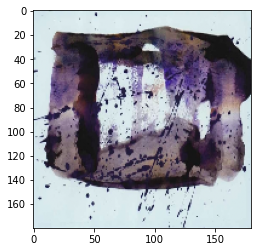

In [49]:
plt.imshow(X_test_scaled[0])

In [46]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
])


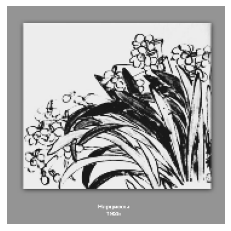

In [50]:
plt.axis('off')
plt.imshow(X[0])

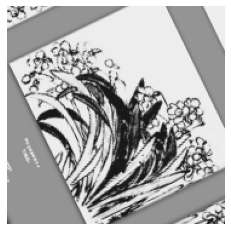

In [48]:
plt.axis('off')
plt.imshow(data_augmentation(X)[0].numpy().astype("uint8"))

In [441]:
num_classes = 5

aug_model = Sequential([
  data_augmentation,
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

aug_model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
aug_model.fit(X_train_scaled, y_train, epochs=30)    

Epoch 1/30
168/168 [==============================] - 35s 202ms/step - loss: 1.5016 - accuracy: 0.3235
Epoch 2/30
168/168 [==============================] - 35s 207ms/step - loss: 1.3416 - accuracy: 0.4286
Epoch 3/30
168/168 [==============================] - 37s 220ms/step - loss: 1.2454 - accuracy: 0.4967
Epoch 4/30
168/168 [==============================] - 37s 221ms/step - loss: 1.1941 - accuracy: 0.5089
Epoch 5/30
168/168 [==============================] - 37s 219ms/step - loss: 1.1393 - accuracy: 0.5350
Epoch 6/30
168/168 [==============================] - 37s 219ms/step - loss: 1.1144 - accuracy: 0.5466
Epoch 7/30
168/168 [==============================] - 36s 217ms/step - loss: 1.1029 - accuracy: 0.5458
Epoch 8/30
168/168 [==============================] - 37s 218ms/step - loss: 1.0874 - accuracy: 0.5511
Epoch 9/30
168/168 [==============================] - 37s 220ms/step - loss: 1.0540 - accuracy: 0.5664
Epoch 10/30
168/168 [==============================] - 37s 220ms/step - l

In [442]:
aug_model.evaluate(X_test_scaled,y_test)

56/56 [==============================] - 3s 44ms/step - loss: 1.0853 - accuracy: 0.5991


[1.0852569341659546, 0.5991041660308838]

In [444]:
aug_predictions = model.predict(X_test_scaled)
aug_predictions

array([[  4.3157673 ,  -7.6233463 ,  17.870642  ,  24.258936  ,
         -7.052578  ],
       [  0.6668936 ,  14.042832  ,   3.2622828 ,  -4.6573386 ,
         -4.9976377 ],
       [ 19.612083  ,   0.60413253,   7.586482  ,   3.4297338 ,
        -23.500809  ],
       ...,
       [-13.574375  ,   5.678409  ,   8.913695  ,  13.258176  ,
         13.28893   ],
       [-15.697706  ,  -4.340861  ,  36.8396    ,  41.6164    ,
        -27.660654  ],
       [ -3.4444141 ,   5.759125  ,  -5.366559  ,  -4.72851   ,
         12.831385  ]], dtype=float32)

In [448]:
aug_score = tf.nn.softmax(aug_predictions[1])

In [449]:
np.argmax(aug_score)

1

In [450]:
y_test[1]

1

In [600]:
aug_model.save('my_model.h5')

In [452]:
new_model = tf.keras.models.load_model('my_model.h5')

In [215]:
test_image_prediction=X_test_scaled[0:1000]

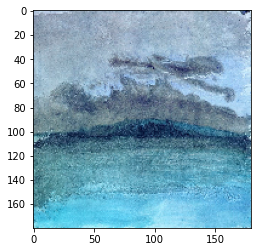

In [601]:
plt.imshow(test_image_prediction[25])

In [454]:
new_predict=new_model.predict(test_image_prediction)

In [604]:
score = tf.nn.softmax(new_predict[1])

In [456]:
predicted_emotion=np.argmax(score)

In [457]:
print(predicted_emotion)

1


In [584]:
img_prediction1 = cv2.imread(str(emotions_images_dict['sad'][250]))
img_prediction2 = cv2.imread(str(emotions_images_dict['very_sad'][20]))

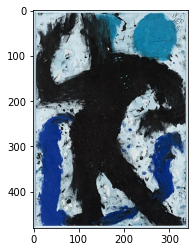

In [585]:
plt.imshow(img_prediction1)

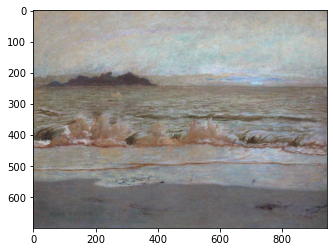

In [586]:
plt.imshow(img_prediction2)

In [587]:
test=[]
resized_test_img1 = cv2.resize(img_prediction1,(180,180))
resized_test_img2 = cv2.resize(img_prediction2,(180,180))
test.append(resized_test_img1)
test.append(resized_test_img2)



In [588]:
test=np.array(test)

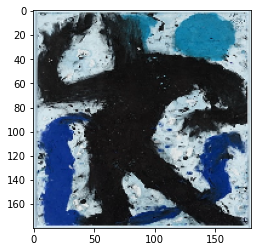

In [589]:
plt.imshow(test[0])

In [590]:
type(test)

numpy.ndarray

In [591]:
new_predict=new_model.predict(test)

In [595]:
score = tf.nn.softmax(new_predict[0])

In [596]:
predicted_emotion=np.argmax(score)

In [597]:
print(predicted_emotion)

3


In [598]:
if predicted_emotion==0:
    print("Very Happy")
elif predicted_emotion==1:
    print("Happy")
elif predicted_emotion==2:
    print("Neutral")
elif predicted_emotion==3:
    print("Sad")
else:
    print("Very Sad")
    
        

Sad
